In [8]:
import os
import cv2
import easyocr
import numpy as np
import pandas as pd
import tensorflow as tf
import pytesseract as pt
import plotly.express as px
import matplotlib.pyplot as plt
import xml.etree.ElementTree as xet

from glob import glob
from skimage import io
from shutil import copy
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import TensorBoard
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.layers import Dense, Dropout, Flatten, Input
from tensorflow.keras.preprocessing.image import load_img, img_to_array


In [1]:
!pip list
# print("jefe");

Package                Version
---------------------- ------------
absl-py                1.4.0
astor                  0.8.1
attrs                  23.1.0
backcall               0.2.0
certifi                2022.12.7
charset-normalizer     2.1.1
colorama               0.4.6
cycler                 0.11.0
debugpy                1.5.1
decorator              5.1.1
easyocr                1.7.0
entrypoints            0.4
fastjsonschema         2.17.1
fonttools              4.38.0
gast                   0.5.4
google-pasta           0.2.0
grpcio                 1.42.0
h5py                   2.10.0
idna                   3.4
imageio                2.31.1
importlib-metadata     4.11.4
importlib-resources    5.12.0
ipykernel              6.15.2
ipython                7.31.1
jedi                   0.18.1
joblib                 1.3.1
jsonschema             4.17.3
jupyter_client         7.4.8
jupyter_core           4.11.1
Keras                  2.3.1
Keras-Applications     1.0.8
Keras-Preprocessing 

In [15]:
model = tf.keras.models.load_model('./models/Object_Detection.h5')
print('Model loaded Sucessfully')

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Model loaded Sucessfully


In [9]:
path = './data/TEST/N22.jpeg'
image = load_img(path) # PIL object
image = np.array(image,dtype=np.uint8) # 8 bit array (0,255)
image1 = load_img(path,target_size=(224,224))
image_arr_224 = img_to_array(image1)/255.0  # Convert into array and get the normalized output


In [10]:
# Size of the orginal image
h,w,d = image.shape
print('Height of the image =',h)
print('Width of the image =',w)

Height of the image = 1080
Width of the image = 1920


In [11]:
fig = px.imshow(image)
fig.update_layout(width=700, height=500,  margin=dict(l=10, r=10, b=10, t=10), xaxis_title='Figure 13 - TEST Image')

In [12]:
image_arr_224.shape

(224, 224, 3)

In [13]:
test_arr = image_arr_224.reshape(1,224,224,3)
test_arr.shape

(1, 224, 224, 3)

In [16]:
# Make predictions
coords = model.predict(test_arr)
coords

array([[0.24995543, 0.43680266, 0.8425621 , 0.91168064]], dtype=float32)

In [19]:
# Denormalize the values
denorm = np.array([w,w,h,h])
coords = coords * denorm
coords

array([[1.76915654e+09, 3.09164027e+09, 1.06138556e+09, 1.14845504e+09]])

In [20]:
coords = coords.astype(np.int32)
coords

array([[ 1769156542, -2147483648,  1061385562,  1148455040]])

In [21]:
# Draw bounding on top the image
xmin, xmax,ymin,ymax = coords[0]
pt1 =(xmin,ymin)
pt2 =(xmax,ymax)
print(pt1, pt2)

(1769156542, 1061385562) (-2147483648, 1148455040)


In [22]:
cv2.rectangle(image,pt1,pt2,(0,255,0),3)
fig = px.imshow(image)
fig.update_layout(width=700, height=500, margin=dict(l=10, r=10, b=10, t=10))

### Pipeline

In [23]:
path = './data/TEST/N30.jpeg'
def object_detection(path):
    
    # Read image
    image = load_img(path) # PIL object
    image = np.array(image,dtype=np.uint8) # 8 bit array (0,255)
    image1 = load_img(path,target_size=(224,224))
    
    # Data preprocessing
    image_arr_224 = img_to_array(image1)/255.0 # Convert to array & normalized
    h,w,d = image.shape
    test_arr = image_arr_224.reshape(1,224,224,3)
    
    # Make predictions
    coords = model.predict(test_arr)
    
    # Denormalize the values
    denorm = np.array([w,w,h,h])
    coords = coords * denorm
    coords = coords.astype(np.int32)
    
    # Draw bounding on top the image
    xmin, xmax,ymin,ymax = coords[0]
    pt1 =(xmin,ymin)
    pt2 =(xmax,ymax)
    #print(pt1, pt2)
    cv2.rectangle(image,pt1,pt2,(0,255,0),3)
    return image, coords

In [24]:
image, cods = object_detection(path)

In [25]:
fig = px.imshow(image)
fig.update_layout(width=700, height=500, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 14')

In [26]:
img = np.array(load_img(path))
image_np_with_detections = img.copy()
xmin ,xmax,ymin,ymax = cods[0]
roi = img[ymin:ymax,xmin:xmax]
fig = px.imshow(roi)
fig.update_layout(width=350, height=250, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 15 Cropped image')

In [27]:
# extract text from image
text = pt.image_to_string(roi)
print(text)

## OCR

In [28]:
reader = easyocr.Reader(['en'])
ocr_result = reader.readtext(roi)
ocr_result

[([[45, 5], [256, 5], [256, 52], [45, 52]], 'RK*61-S', 0.17049265492193966)]

### OCR Filtering

In [24]:
region_threshold=0.05
def filter_text(roi, ocr_result, region_threshold):
    rectangle_size = roi.shape[0]*roi.shape[1]
    
    plate = [] 
    for result in ocr_result:
        length = np.sum(np.subtract(result[0][1], result[0][0]))
        height = np.sum(np.subtract(result[0][2], result[0][1]))
        
        if length*height / rectangle_size > region_threshold:
            plate.append(result[1])
    return plate

In [26]:
filter_text(roi, ocr_result, region_threshold)

NameError: name 'ocr_result' is not defined

### Pipeline OCR

In [41]:
region_threshold=0.05
def ocr_it(image, region_threshold):
    # Full image dimensions
    width = image.shape[1]
    height = image.shape[0]
    
    #ROI
    img = np.array(load_img(path))
    xmin ,xmax,ymin,ymax = cods[0]
    roi = img[ymin:ymax,xmin:xmax]
    
    #Apply OCR to ROI
    reader = easyocr.Reader(['en'])
    ocr_result = reader.readtext(roi)

    
    # Apply ROI filtering and OCR
    text = [] 
    rectangle_size = roi.shape[0]*roi.shape[1]
    for result in ocr_result:
        length = np.sum(np.subtract(result[0][1], result[0][0]))
        height = np.sum(np.subtract(result[0][2], result[0][1]))
        if length*height / rectangle_size > region_threshold:
            text.append(result[1])
    plt.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB))
    plt.show()
    print(text)
    return text, roi

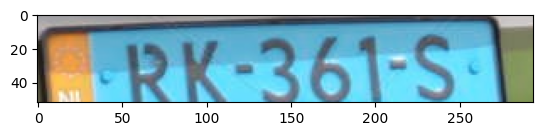

['RK*61-S']


In [42]:
text, region = ocr_it(image,region_threshold)

In [7]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder
from object_detection.utils import config_util

ModuleNotFoundError: No module named 'object_detection.utils'

In [43]:
import csv
import uuid

In [44]:
'{}.jpg'.format(uuid.uuid1())


'92d7c630-6d17-11ee-9d51-bf1de798c1a2.jpg'

In [45]:
def save_results(text, region, csv_filename, folder_path):
    img_name = '{}.jpg'.format(uuid.uuid1())
    
    cv2.imwrite(os.path.join(folder_path, img_name), region)
    
    with open(csv_filename, mode='a', newline='') as f:
        csv_writer = csv.writer(f, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
        csv_writer.writerow([img_name, text])

In [47]:
save_results(text, region, 'detection_results.csv', 'Detection_Images')

In [56]:
# !pip uninstall opencv-python-headless -y
!pip install opencv-python-headless

     ---------------------------------------- 38.0/38.0 MB 3.3 MB/s eta 0:00:00


In [66]:
cap = cv2.VideoCapture(0)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
#cv2.imshow('object detection',  cv2.resize(image_np_with_detections, (800, 600)))
while cap.isOpened(): 
    ret, frame = cap.read()
#     image_np = np.array(frame)
    
    # Read image
#     image = load_img(frame) # PIL object
#     image = np.array(image,dtype=np.uint8) # 8 bit array (0,255)
#     image1 = load_img(frame,target_size=(224,224))
    
#     # Data preprocessing
#     image_arr_224 = img_to_array(image1)/255.0 # Convert to array & normalized
#     h,w,d = image.shape
#     test_arr = image_arr_224.reshape(1,224,224,3)
    
#     # Make predictions
#     coords = model.predict(test_arr)
    
#     # Denormalize the values
#     denorm = np.array([w,w,h,h])
#     coords = coords * denorm
#     coords = coords.astype(np.int32)
    
#     # Draw bounding on top the image
#     xmin, xmax,ymin,ymax = coords[0]
#     pt1 =(xmin,ymin)
#     pt2 =(xmax,ymax)
#     #print(pt1, pt2)
#     cv2.rectangle(image,pt1,pt2,(0,255,0),3)
#           agnostic_mode=False)
    
#     try: 
#         text, region = ocr_it(image_np_with_detections, region_threshold)
#         save_results(text, region, 'realtimeresults.csv', 'Detection_Images')
#     except:
#         pass

     #cv2.imshow('object detection',  cv2.resize(image_np_with_detections, (800, 600)))
    cv2.imshow('frame',frame)
    if cv2.waitKey(10) & 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()

error: OpenCV(4.8.0) D:\a\opencv-python\opencv-python\opencv\modules\highgui\src\window.cpp:971: error: (-215:Assertion failed) size.width>0 && size.height>0 in function 'cv::imshow'
